## 0. Structure of Tool Tracking Data

You have one dedicated folder for each __(hand) tool__. On the next level are folders for each __measurement campaign__. The undermost level contains all __measurements__ of the corresponding measurement campaign.

The preferred way to access the data for analysis and learning is using the `data-tools` package which is part of this repository.

![data_structure](./info/structure_scheme.jpg)

## 1. Load Data with `data-tools`

First we have to connect to our downloaded data using the main class:

In [134]:
from pathlib import Path
from datatools.fixture import setup_dummy_data
# test_tool
# source = setup_dummy_data(5)

# put data into this source folder
source = "./data-tools/tool-tracking-data/"

In [135]:
from datatools import MeasurementDataReader, Measurement, MeasurementSeries, Action
mdr = MeasurementDataReader(source=source)

In [136]:
from datatools import Tool, Config, MeasurementSeries, Measurement, DataTypes, Action
from datatools import ACC, GYR, MAG, MIC, POS, VEL

mytool = "electric_screwdriver"

# data_dict = mdr.query(query_type=Action).filter_by(Action == "undefined", Tool == mytool).get()
# data_dict = mdr.query(query_type=Action).filter_by( Tool == mytool).get()

# Devuelve las mediciones de todos los usuarios, se debe filtrar después por usuario.
# # dict_keys(['04', '02', '01', '03'])
data_dict = mdr.query(query_type=Measurement).filter_by( Tool == mytool).get()  

[INFO] Preparing data from:
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716


[INFO] Read data:  38%|███▊      | 6/16 [00:00<00:00, 55.56it/s, file=MAG-01-155.087.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-04-154.967.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-02-154.679.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-track

[INFO] Read data:  75%|███████▌  | 12/16 [00:00<00:00, 30.43it/s, file=ACC-03-102.291.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-04-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-03-154.871.csv) and from the timestamps differ by 0.002Hz



[INFO] Read annotation: 100%|██████████| 16/16 [00:01<00:00, 14.90it/s, file=data-03.annotation]


[INFO] Finished with 4 measurement(s).


In [137]:
import numpy as np
from seglearn.base import TS_Data
from seglearn.pipe import Pype
from fhgutils import Segment, contextual_recarray_dtype, filter_ts_data
from datatools import to_ts_data

In [215]:
window_length=0.5 # unit in s
overlap = 0.0 # unit in percent

# clean and window data
# para obtener todas las mediciones de todos los usuarios
data_dict = mdr.query().filter_by(Tool == mytool).get() 

# para obtener todas las mediciones de todos los usuarios
Xt, Xc, y = to_ts_data(data_dict, contextual_recarray_dtype) 

# para obtener todas las mediciones de un  los usuarios (01)
# Xt, Xc, y = to_ts_data(data_dict['01'], contextual_recarray_dtype) 

X = TS_Data(Xt, Xc)
pipe = Pype([
    ('segment', Segment(window_length=window_length, overlap=overlap, enforce_size=True, n=len(np.unique(Xc.desc))))
])

X_trans, y_trans = pipe.fit_transform(X, y)

[INFO] Preparing data from:
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716


[INFO] Read data:  44%|████▍     | 7/16 [00:00<00:00, 68.55it/s, file=ACC-04-102.291.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-04-154.967.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-02-154.679.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-track

[INFO] Read data:  88%|████████▊ | 14/16 [00:00<00:00, 23.96it/s, file=MAG-03-154.871.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-04-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-03-154.871.csv) and from the timestamps differ by 0.002Hz



[INFO] Read annotation: 100%|██████████| 16/16 [00:01<00:00, 15.52it/s, file=data-03.annotation]


[INFO] Finished with 4 measurement(s).
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
Segment: 100%|██████████| 11628/11628 [00:00<00:00, 178130.31it/s]


In [216]:
# Seleccionar los datos para un usuario específico, para todas las clases de funcionamiento.
# Cuando se seleccionan varios sensores, las ventanas se configuran para que las primeras 4 ventanas, sean la de acc, gyr, mag y mic respectivamente. 
# Se genera una ventana por cada sensor y después se construye la ventana final con los datos de todos los sensores. (OBS: El modelo podría no funcionar si no se tiene en cuenta el orden de los sensores)
print("[INFO] extract segmented ACC data")
Xt_acc, Xc_acc, y_acc = filter_ts_data(X_trans, y_trans, filt={'desc': ['acc'], 'id':1})

print("[INFO] extract segmented GYR data")
Xt_gyr, Xc_gyr, y_gyr = filter_ts_data(X_trans, y_trans, filt={'desc': ['gyr'], 'id':1})

# Cantidad de ventanas para cada sensor
print(Xt_acc.shape, Xt_gyr.shape)

[INFO] extract segmented ACC data
[INFO] extract segmented GYR data
(816,) (816,)


(51, 4)

In [7]:
# Combinar los datos de ACC y GYR en una sola lista de arrays
import numpy as np

lista_combinada = []

for arr1, arr2 in zip(Xt_acc, Xt_gyr):
    timestamps = arr1[:, 0].reshape(-1, 1)
    arr1_data = arr1[:, 1:]
    arr2_data = arr2[:, 1:]
    
    combined = np.hstack((timestamps, arr1_data, arr2_data))
    lista_combinada.append(combined)


In [8]:
# Para visualizar los datos combinados como un DataFrame
import pandas as pd
pd.set_option('display.float_format', '{:.6f}'.format)
# Convertimos todas las sublistas en un solo DataFrame
# Primero concatenamos todas las sublistas de X
data = [row for sublist in lista_combinada for row in sublist]

# Creamos el DataFrame
df_acc = pd.DataFrame(data, columns=["ts", "x_acc", "y_acc", "z_acc", "x_gyr", "y_gyr", "z_gyr"])
df_acc.head()

,ts,x_acc,y_acc,z_acc,x_gyr,y_gyr,z_gyr
0,1594226584.683914,-0.130942,0.114597,8.508987,0.061785,-0.048367,-0.022144
1,1594226584.693690,-1.120021,-0.197710,9.812131,0.065227,-0.005365,-0.051339
2,1594226584.703467,-0.684129,-0.238792,10.020166,0.060279,-0.002330,-0.028446
3,1594226584.713243,-0.303485,-0.227655,9.946131,0.071601,0.005497,0.057828
4,1594226584.723019,-0.584381,-0.565220,10.498164,0.050001,0.014736,0.073481


In [9]:
# Verificamos que las listas de ACC y GYR son iguales. Comparten las mismas etiquetas para cada ventana.
import numpy as np

def comparar_listas_elemento_a_elemento(lista1, lista2):
    """Compara dos listas elemento por elemento (cada elemento puede ser lista o array)."""
    if len(lista1) != len(lista2):
        print("Las listas tienen distinta longitud.")
        return False
    
    for i, (elem1, elem2) in enumerate(zip(lista1, lista2)):
        if isinstance(elem1, np.ndarray) and isinstance(elem2, np.ndarray):
            if not np.array_equal(elem1, elem2):
                print(f"Diferencia en el índice {i}:")
                print(f"  lista1[{i}] = {elem1}")
                print(f"  lista2[{i}] = {elem2}")
                return False
        else:
            if elem1 != elem2:
                print(f"Diferencia en el índice {i}: {elem1} != {elem2}")
                return False
    
    return True

# Supón que y_acc y y_gyr están definidos como listas de arrays
print(f"Comparación elemento a elemento (y_acc vs. y_gyr): {comparar_listas_elemento_a_elemento(y_acc, y_gyr)}")


Comparación elemento a elemento (y_acc vs. y_gyr): True


In [10]:
import pandas as pd
import plotly.express as px

# Example: create a DataFrame with data

data_acc = data_dict["01"].acc.ts
data_acc_clases = data_dict["01"].acc.y

df_acc = pd.DataFrame({
    'ts': data_acc[:, 0], 
    'x': data_acc[:, 1],
    'y': data_acc[:, 2],
    'z': data_acc[:, 3],
    'clases': data_acc_clases
})

# Interactive line plot with dynamic zoom

fig = px.line(df_acc, x='ts', y=['x', 'y', 'z', 'clases'], title='Aceleration Data Over Time')
fig.update_layout(xaxis_title='Time [a.u.]', yaxis_title='Aceleration (m/s²)',)
fig.show()

In [11]:
import pandas as pd
import plotly.express as px

# Example: create a DataFrame with data

user = "02"

data_gyr = data_dict[user].gyr.ts
data_gyr_clases = data_dict[user].gyr.y

df_gyr = pd.DataFrame({
    'ts': data_gyr[:, 0], 
    'x': data_gyr[:, 1],
    'y': data_gyr[:, 2],
    'z': data_gyr[:, 3],
    'clases': data_gyr_clases
})

# Interactive line plot with dynamic zoom

fig = px.line(df_gyr, x='ts', y=['x', 'y', 'z', 'clases'], title='Gyroscope Data Over Time')
fig.update_layout(xaxis_title='Time [a.u.]', yaxis_title='Gyroscope (m/s²)',)
fig.show()

In [12]:
df_acc.head()

,ts,x,y,z,clases
0,1594226277.185980,-5.877378,1.322051,8.612491,8.000000
1,1594226277.195756,-5.819897,1.293310,8.593329,8.000000
2,1594226277.205532,-5.759623,1.242309,8.570148,8.000000
3,1594226277.215309,-5.678891,1.217463,8.569380,8.000000
4,1594226277.225084,-5.483504,1.211880,8.418252,8.000000


In [13]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

user = "04"

# --- Datos del acelerómetro ---
data_acc = data_dict[user].acc.ts
data_acc_clases = data_dict[user].acc.y

df_acc = pd.DataFrame({
    'ts': data_acc[:, 0], 
    'x': data_acc[:, 1],
    'y': data_acc[:, 2],
    'z': data_acc[:, 3],
    'clases': data_acc_clases
})

# --- Datos del giroscopio ---
data_gyr = data_dict[user].gyr.ts
data_gyr_clases = data_dict[user].gyr.y

df_gyr = pd.DataFrame({
    'ts': data_gyr[:, 0], 
    'x': data_gyr[:, 1],
    'y': data_gyr[:, 2],
    'z': data_gyr[:, 3],
    'clases': data_gyr_clases
})

# --- Crear subplots compartiendo eje x ---
fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=True,
    subplot_titles=("Acelerómetro - Aceleración", "Giroscopio - Velocidad Angular", "Magnetómetro - Campo Magnético"),
)

# --- Trazas para acelerómetro ---
fig.add_trace(go.Scatter(x=df_acc['ts'], y=df_acc['x'], mode='lines', name='acc_x'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_acc['ts'], y=df_acc['y'], mode='lines', name='acc_y'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_acc['ts'], y=df_acc['z'], mode='lines', name='acc_z'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_acc['ts'], y=df_acc['clases'], mode='lines', name='acc_clase', line=dict(dash='dot', color='black')), row=1, col=1)

# --- Trazas para giroscopio ---
fig.add_trace(go.Scatter(x=df_gyr['ts'], y=df_gyr['x'], mode='lines', name='gyr_x'), row=2, col=1)
fig.add_trace(go.Scatter(x=df_gyr['ts'], y=df_gyr['y'], mode='lines', name='gyr_y'), row=2, col=1)
fig.add_trace(go.Scatter(x=df_gyr['ts'], y=df_gyr['z'], mode='lines', name='gyr_z'), row=2, col=1)
fig.add_trace(go.Scatter(x=df_gyr['ts'], y=df_gyr['clases'], mode='lines', name='gyr_clase', line=dict(dash='dot', color='gray')), row=2, col=1)

# --- Layout general ---
fig.update_layout(
    height=700,
    title_text="Datos sincronizados de Acelerómetro y Giroscopio",
    xaxis_title='Tiempo [a.u.]',
    yaxis_title='Aceleración (m/s²)',
    xaxis2_title='Tiempo [a.u.]',
    yaxis2_title='Velocidad Angular (rad/s)',
)

fig.show()


### Desarrollo del Proyecto

In [231]:
# Combinar los datos de ACC y GYR en una sola lista de arrays
import numpy as np
from collections import Counter
import torch

def combinar_datos(Xt_acc, Xt_gyr):
    """
    Combina los datos de acelerómetro y giroscopio en una lista de arrays.
    
    Args:
        Xt_acc (list): Lista de arrays de datos del acelerómetro.
        Xt_gyr (list): Lista de arrays de datos del giroscopio.
        
    Returns:
        list: Lista combinada de arrays con datos de ambos sensores sin el timestamp
    """
    lista_combinada = []

    for arr1, arr2 in zip(Xt_acc, Xt_gyr):
        timestamps = arr1[:, 0].reshape(-1, 1)
        arr1_data = arr1[:, 1:]
        arr2_data = arr2[:, 1:]
        
        # combined = np.hstack((timestamps, arr1_data, arr2_data)) # si queremos con timestamp
        combined = np.hstack((arr1_data, arr2_data))
        lista_combinada.append(combined)
        
    return lista_combinada

def analizar_ventanas_etiquetas(lista_sensores, lista_de_ventanas, umbral=0.8, verbose=False):
    """
    Analiza una lista de tensores de etiquetas (uno por ventana).
    Devuelve una lista de tensores con la etiqueta dominante por ventana o -1 si no hay dominante.

    Parámetros:
        lista_de_ventanas (list[Tensor]): cada tensor debe ser 1D (ej: etiquetas float32).
        umbral (float): proporción mínima para aceptar clase dominante (por defecto 0.8).
        verbose (bool): si True, imprime detalles.

    Retorna:
        list[Tensor]: lista de tensores escalares con la etiqueta dominante o -1.
    """
    sensores_representativos  = []
    etiquetas_representativas = []

    for idx, ventana in enumerate(lista_de_ventanas):
        if not isinstance(ventana, torch.Tensor):
            raise TypeError(f"Elemento en posición {idx} no es un tensor.")
        if ventana.ndim != 1:
            raise ValueError(f"Tensor en posición {idx} no es unidimensional.")

        etiquetas = ventana.cpu().numpy().astype(int).tolist()
        counter = Counter(etiquetas)
        etiqueta_mayoritaria, frecuencia = counter.most_common(1)[0]
        proporcion = frecuencia / len(etiquetas)

        if verbose:
            print(f"Ventana {idx+1}: {etiquetas}")
            print(f"  Frecuencias: {dict(counter)}")

        if proporcion >= umbral and etiqueta_mayoritaria != 14:
            if verbose:
                print(f"  ✅ Clase representativa: {etiqueta_mayoritaria} (x{frecuencia}, {proporcion:.2%})\n")
            sensores_representativos.append(lista_sensores[idx])
            # cambiamos la etiqueta 8 por 0
            if etiqueta_mayoritaria == 8:
                etiqueta_mayoritaria = 0
            if etiqueta_mayoritaria == 7:
                etiqueta_mayoritaria = 1
            etiqueta_tensor = torch.tensor(etiqueta_mayoritaria, dtype=torch.int64)
            etiquetas_representativas.append(etiqueta_tensor)
        else:
            if verbose:
                print(f"  ❌ No hay clase dominante (frecuencia: {proporcion:.2%})\n")
    return sensores_representativos, etiquetas_representativas





#### Escalamos los datos

In [ ]:

def train_data_scaled(Xt, scaler):
    #Concatenar todas las ventanas (por fila)
    X_all = np.vstack(Xt)  # shape: (n_total_samples, 4)

    #Separar las columnas
    timestamps = X_all[:, 0].reshape(-1, 1)  # Columna timestamp
    ejes = X_all[:, 1:]  # ejex, ejey, ejez

    #Ajustar el scaler solo con los ejes
    # scaler = MinMaxScaler()
    ejes_scaled = scaler.fit_transform(ejes)

    #Volver a armar la matriz completa si quieres conservar timestamp
    X_all_scaled = np.hstack([timestamps, ejes_scaled])

    #Volver a dividir en ventanas del mismo largo original
    Xt_scaled = []
    start = 0
    for ventana in Xt:
        n = ventana.shape[0]  # largo de la ventana original
        Xt_scaled.append(X_all_scaled[start:start + n])
        start += n
    
    return Xt_scaled

def valid_test_data_scaled(Xt, scaler):
    # Repetir el proceso pero solo usando .transform (NO .fit_transform)
    X_val_all = np.vstack(Xt)
    timestamps_val = X_val_all[:, 0].reshape(-1, 1)
    ejes_val = X_val_all[:, 1:]

    # scaler = MinMaxScaler()
    ejes_val_scaled = scaler.transform(ejes_val)
    X_val_all_scaled = np.hstack([timestamps_val, ejes_val_scaled])

    Xt_scaled = []
    start = 0
    for ventana in Xt:
        n = ventana.shape[0]
        Xt_scaled.append(X_val_all_scaled[start:start + n])
        start += n
    
    return Xt_scaled

## Definimos la Ren Convolucional Temporal TCN

In [191]:
import torch

import numpy as np

from sklearn.preprocessing import MinMaxScaler

from seglearn.base import TS_Data
from seglearn.pipe import Pype
from fhgutils import Segment, contextual_recarray_dtype, filter_ts_data
from datatools import to_ts_data

from pathlib import Path
from datatools.fixture import setup_dummy_data

from datatools import MeasurementDataReader, Measurement, MeasurementSeries, Action
mdr = MeasurementDataReader(source=source)

# put data into this source folder
source = "./data-tools/tool-tracking-data/"

# Función data_generator correcta
def data_generator(mdr, window_length=0.1, overlap=0.1):
    mytool = "electric_screwdriver"

    # data_dict = mdr.query(query_type=Action).filter_by(Action == "undefined", Tool == mytool).get()
    # data_dict = mdr.query(query_type=Action).filter_by( Tool == mytool).get()

    # Devuelve las mediciones de todos los usuarios, se debe filtrar después por usuario.
    # # dict_keys(['04', '02', '01', '03'])
    data_dict = mdr.query(query_type=Measurement).filter_by( Tool == mytool).get() 

    # window_length=0.5 # unit in s
    # overlap = 0.5 # unit in percent

    # clean and window data
    # para obtener todas las mediciones de todos los usuarios
    data_dict = mdr.query().filter_by(Tool == mytool).get() 

    # para obtener todas las mediciones de todos los usuarios
    Xt, Xc, y = to_ts_data(data_dict, contextual_recarray_dtype) 

    # para obtener todas las mediciones de un  los usuarios (01)
    # Xt, Xc, y = to_ts_data(data_dict['01'], contextual_recarray_dtype) 

    X = TS_Data(Xt, Xc)
    pipe = Pype([
        ('segment', Segment(window_length=window_length, overlap=overlap, enforce_size=True, n=len(np.unique(Xc.desc))))
    ])
    X_trans, y_trans = pipe.fit_transform(X, y)

    print("[INFO] extract segmented ACC data")
    Xt_acc_train1, Xc_acc_train1, y_acc_train1 = filter_ts_data(X_trans, y_trans, filt={'desc': ['acc'], 'id':1})
    print("[INFO] extract segmented GYR data")
    Xt_gyr_train1, Xc_gyr_train1, y_gyr_train1 = filter_ts_data(X_trans, y_trans, filt={'desc': ['gyr'], 'id':1})

    print("[INFO] extract segmented ACC data")
    Xt_acc_train4, Xc_acc_train4, y_acc_train4 = filter_ts_data(X_trans, y_trans, filt={'desc': ['acc'], 'id':4})
    print("[INFO] extract segmented GYR data")
    Xt_gyr_train4, Xc_gyr_train4, y_gyr_train4 = filter_ts_data(X_trans, y_trans, filt={'desc': ['gyr'], 'id':4})

    Xt_acc_train = np.concatenate([Xt_acc_train1, Xt_acc_train4])
    Xt_gyr_train = np.concatenate([Xt_gyr_train1, Xt_gyr_train4])
    y_acc_train  = np.concatenate([y_acc_train1, y_acc_train4])

    # Escalado para datos de entrenamiento
    scaler = MinMaxScaler()
    Xt_acc_train_scaled = train_data_scaled(Xt_acc_train, scaler)
    Xt_gyr_train_scaled = train_data_scaled(Xt_gyr_train, scaler)
    X_train = combinar_datos(Xt_acc_train_scaled, Xt_gyr_train_scaled)

    print("[INFO] extract segmented ACC data")
    Xt_acc_valid, Xc_acc_valid, y_acc_valid = filter_ts_data(X_trans, y_trans, filt={'desc': ['acc'], 'id':2})
    print("[INFO] extract segmented GYR data")
    Xt_gyr_valid, Xc_gyr_valid, y_gyr_valid = filter_ts_data(X_trans, y_trans, filt={'desc': ['gyr'], 'id':2})

    # Escalado para datos de validacion
    Xt_acc_valid_scaled = valid_test_data_scaled(Xt_acc_valid, scaler)
    Xt_gyr_valid_scaled = valid_test_data_scaled(Xt_gyr_valid, scaler)
    X_valid = combinar_datos(Xt_acc_valid_scaled, Xt_gyr_valid_scaled)

    print("[INFO] extract segmented ACC data")
    Xt_acc_test, Xc_acc_test, y_acc_test = filter_ts_data(X_trans, y_trans, filt={'desc': ['acc'], 'id':3})
    print("[INFO] extract segmented GYR data")
    Xt_gyr_test, Xc_gyr_test, y_gyr_test = filter_ts_data(X_trans, y_trans, filt={'desc': ['gyr'], 'id':3})

    # Escalado para datos de testing
    Xt_acc_test_scaled = valid_test_data_scaled(Xt_acc_test, scaler)
    Xt_gyr_test_scaled = valid_test_data_scaled(Xt_gyr_test, scaler)
    X_test = combinar_datos(Xt_acc_test_scaled, Xt_gyr_test_scaled)
    
    X_train     = [torch.tensor([sub for sub in x], dtype=torch.float32) for x in X_train]
    y_acc_train = [torch.tensor([sub for sub in x], dtype=torch.float32) for x in y_acc_train]

    X_valid     = [torch.tensor([sub for sub in x], dtype=torch.float32) for x in X_valid]
    y_acc_valid = [torch.tensor([sub for sub in x], dtype=torch.float32) for x in y_acc_valid]

    X_test      = [torch.tensor([sub for sub in x], dtype=torch.float32) for x in X_test]
    y_acc_test  = [torch.tensor([sub for sub in x], dtype=torch.float32) for x in y_acc_test]

    # Remapeado de etiquetas
    # Etiquetas reales
    original_classes = sorted(np.unique(y_acc_train + y_acc_valid + y_acc_test))  # [2, 3, ..., 14]
    # Crea un diccionario de mapeo: {2:0, 3:1, ..., 14:7}
    class_to_index = {label: idx for idx, label in enumerate(original_classes)}
    index_to_class = {idx: label for label, idx in class_to_index.items()}

    # 1. Filtrar primero
    X_train, y_acc_train = analizar_ventanas_etiquetas(X_train, y_acc_train)
    X_valid, y_acc_valid = analizar_ventanas_etiquetas(X_valid, y_acc_valid)
    X_test, y_acc_test   = analizar_ventanas_etiquetas(X_test, y_acc_test)

    # 2. Luego remapear
    original_classes = sorted(np.unique([y.item() for y in y_acc_train + y_acc_valid + y_acc_test]))
    class_to_index = {label: idx for idx, label in enumerate(original_classes)}
    index_to_class = {idx: label for label, idx in class_to_index.items()}

    # y_acc_train = [torch.tensor(class_to_index[y.item()]) for y in y_acc_train]
    # y_acc_valid = [torch.tensor(class_to_index[y.item()]) for y in y_acc_valid]
    # y_acc_test  = [torch.tensor(class_to_index[y.item()]) for y in y_acc_test]
    
    return X_train, X_valid, X_test, y_acc_train, y_acc_valid, y_acc_test

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

from collections import Counter


# TCN Model definition
class Chomp1d(nn.Module):
    def __init__(self, chomp_size):
        super(Chomp1d, self).__init__()
        self.chomp_size = chomp_size

    def forward(self, x):
        return x[:, :, :-self.chomp_size].contiguous()

class TemporalBlock(nn.Module):
    def __init__(self, n_inputs, n_outputs, kernel_size, stride, dilation, padding, dropout=0.2):
        super(TemporalBlock, self).__init__()
        self.conv1 = nn.Conv1d(n_inputs, n_outputs, kernel_size,
                                stride=stride, padding=padding, dilation=dilation)
        self.chomp1 = Chomp1d(padding)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(dropout)

        self.conv2 = nn.Conv1d(n_outputs, n_outputs, kernel_size,
                                stride=stride, padding=padding, dilation=dilation)
        self.chomp2 = Chomp1d(padding)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(dropout)

        self.net = nn.Sequential(self.conv1, self.chomp1, self.relu1, self.dropout1,
                                 self.conv2, self.chomp2, self.relu2, self.dropout2)
        self.downsample = nn.Conv1d(n_inputs, n_outputs, 1) if n_inputs != n_outputs else None
        self.relu = nn.ReLU()
        self.init_weights()

    def init_weights(self):
        self.conv1.weight.data.normal_(0, 0.01)
        self.conv2.weight.data.normal_(0, 0.01)
        if self.downsample is not None:
            self.downsample.weight.data.normal_(0, 0.01)

    def forward(self, x):
        out = self.net(x)
        res = x if self.downsample is None else self.downsample(x)
        return self.relu(out + res)

class TemporalConvNet(nn.Module):
    def __init__(self, num_inputs, num_channels, kernel_size=2, dropout=0.2):
        super(TemporalConvNet, self).__init__()
        layers = []
        num_levels = len(num_channels)
        for i in range(num_levels):
            dilation_size = 2 ** i
            in_channels = num_inputs if i == 0 else num_channels[i-1]
            out_channels = num_channels[i]
            layers += [TemporalBlock(in_channels, out_channels, kernel_size, stride=1, dilation=dilation_size,
                                     padding=(kernel_size-1) * dilation_size, dropout=dropout)]

        self.network = nn.Sequential(*layers)

    def forward(self, x):
        return self.network(x)

class TCN(nn.Module):
    def __init__(self, input_size, output_size, num_channels, kernel_size, dropout):
        super(TCN, self).__init__()
        self.tcn = TemporalConvNet(input_size, num_channels, kernel_size=kernel_size, dropout=dropout)
        self.linear = nn.Linear(num_channels[-1], output_size)  # output_size = número de clases
        # self.sig = nn.Sigmoid()

    def forward(self, x):
        # x shape: [batch_size, input_channels=6, sequence_length=51]
        y = self.tcn(x)               # [B, hidden, L]
        y = y[:, :, -1]               # tomamos la última salida temporal: [B, hidden]
        y = self.linear(y)            # [B, output_size=8]
        return y                      # logits para CrossEntropyLoss



# Replace argparse with dictionary for configuration
args = {
    'dropout': 0.10,
    'clip': 0.2,
    'epochs': 100,
    'ksize': 5,
    'levels': 4,
    'log_interval': 100,
    'lr': 1e-3,
    'optim': 'AdamW',
    'nhid': 150,
    'data': 'TCN_AL',
    'seed': 1111,
    'window_length': 0.5, # unit in s
    'overlap': 0.5 # unit in percent
}

# Set the random seed manually for reproducibility.
torch.manual_seed(args['seed'])

# Check for available accelerators
device = torch.device('cpu')  # Default to CPU
if torch.cuda.is_available():
    device = torch.device('cuda')
    print("CUDA is available. Running with CUDA.")
elif torch.backends.mps.is_available():
    device = torch.device('mps')
    print("MPS is available. Running with MPS.")
else:
    print("No GPU accelerator is available. Running with CPU.")

print(args)
input_size = 6 # número de características (3 para acelerómetro y 3 para giroscopio)
output_size = 7 # número de clases
X_train, X_valid, X_test, y_train, y_valid, y_test = data_generator(mdr, args['window_length'], args['overlap'])

n_channels  = [args['nhid']] * args['levels']
kernel_size = args['ksize']
dropout     = args['dropout']

model = TCN(input_size, output_size, n_channels, kernel_size, dropout=args['dropout'])
# Move model to device and ensure it's using float32
model = model.to(device=device, dtype=torch.float32)

# Etiquetas como enteros (no tensores)
flat_labels = [y.item() for y in y_train]
counts = Counter(flat_labels)

original_classes = [
    0, # undefined
    1, # tightening_double
    2, # tightening
    3, # untightening
    4, # motor_activity_cw
    5, # motor_activity_ccw
    6  # manual_motor_rotation
    ]

num_classes = len(original_classes)
weights = np.zeros(num_classes)

for i in range(num_classes):
    weights[i] = 1.0 / (counts[i] + 1e-6)  # +1e-6 evita división por cero

# Opcional: clip para evitar extremos
weights = np.clip(weights, a_min=0, a_max=7.0)
# weights = weights / np.mean(weights)  # normaliza

# Convertir a tensor
weights_tensor = torch.tensor(weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=weights_tensor)

# criterion = nn.CrossEntropyLoss()


lr = args['lr']
optimizer = getattr(optim, args['optim'])(model.parameters(), lr=lr)

def evaluate(X_data, y_data, name='Eval'):
    model.eval()
    total_loss = 0.0
    correct = 0
    count = 0
    with torch.no_grad():
        for idx in range(len(X_data)):
            x = X_data[idx].T.unsqueeze(0).to(device)        # [1, 6, 51]
            y = y_data[idx].to(device).long().unsqueeze(0)   # [1]
            
            output = model(x)                                # [1, 8]
            loss = criterion(output, y)
            total_loss += loss.item()
            
            pred = output.argmax(dim=1)                      # [1]
            correct += (pred == y).sum().item()
            count += 1
    
    avg_loss = total_loss / count
    acc = correct / count
    print(f"{name} loss: {avg_loss:.5f}, accuracy: {acc:.3f}")
    return avg_loss



def train(ep):
    model.train()
    total_loss = 0
    count = 0
    train_idx_list = np.arange(len(X_train), dtype="int32")
    
    for idx in train_idx_list:
        x_raw = X_train[idx]             # [51, 6]
        y_raw = y_train[idx]             # entero entre 1 y 8 (tensor de shape [])

        x = x_raw.T.unsqueeze(0).to(device)    # [1, 6, 51]
        y = y_raw.to(device).long().unsqueeze(0)  # [1] - para batch
        
        optimizer.zero_grad()
        output = model(x)                # shape de [1, 8]
        
        loss = criterion(output, y)      # CrossEntropyLoss espera [B, C] y [B]
        total_loss += loss.item()
        count += 1
        
        loss.backward()
        if args['clip'] > 0:
            torch.nn.utils.clip_grad_norm_(model.parameters(), args['clip'])
        optimizer.step()
        
        if idx > 0 and idx % args['log_interval'] == 0:
            cur_loss = total_loss / count
            print(f"Epoch {ep:2d} | lr {lr:.5f} | loss {cur_loss:.5f}")
            total_loss = 0
            count = 0


if __name__ == "__main__":
    best_vloss = 1e8
    vloss_list = []
    model_name = "proyecto{0}.pt".format(args['data'])
    
    for ep in range(1, args['epochs']+1):
        train(ep)
        vloss = evaluate(X_valid, y_valid, name='Validation')
        # tloss = evaluate(X_test, y_test, name='Test')
        
        if vloss < best_vloss:
            with open(model_name, "wb") as f:
                torch.save(model, f)
                print("Saved model!\n")
            best_vloss = vloss
            
        if ep > 10 and vloss > max(vloss_list[-3:]):
            lr /= 10
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr

        vloss_list.append(vloss)

    print('-' * 89)
    # Updated loading method to avoid compatibility issues
    model = torch.load(open(model_name, "rb"), weights_only=False)



MPS is available. Running with MPS.
{'dropout': 0.1, 'clip': 0.2, 'epochs': 100, 'ksize': 5, 'levels': 4, 'log_interval': 100, 'lr': 0.001, 'optim': 'AdamW', 'nhid': 150, 'data': 'TCN_AL', 'seed': 1111, 'window_length': 0.5, 'overlap': 0.5}
[INFO] Preparing data from:
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716


[INFO] Read data:  38%|███▊      | 6/16 [00:00<00:00, 58.28it/s, file=MAG-01-155.087.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-04-154.967.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-02-154.679.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-track

[INFO] Read data:  75%|███████▌  | 12/16 [00:00<00:00, 30.17it/s, file=ACC-03-102.291.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-04-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-03-154.871.csv) and from the timestamps differ by 0.002Hz



[INFO] Read annotation: 100%|██████████| 16/16 [00:01<00:00, 15.09it/s, file=data-03.annotation]


[INFO] Finished with 4 measurement(s).
[INFO] Preparing data from:
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716
  data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716


[INFO] Read data:   0%|          | 0/16 [00:00<?, ?it/s]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-04-154.967.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-02-154.679.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-02-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-track

[INFO] Read data:  81%|████████▏ | 13/16 [00:00<00:00, 25.82it/s, file=MIC-04-8000.csv]

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-01-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-04-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/GYR-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/ACC-03-102.291.csv) and from the timestamps differ by 0.001Hz

[WARN] The mean sampling rate from the filename (data-tools/tool-tracking-data/electric_screwdriver/pythagoras-10-20200716/MAG-03-154.871.csv) and from the timestamps differ by 0.002Hz



[INFO] Read annotation: 100%|██████████| 16/16 [00:01<00:00, 15.46it/s, file=data-03.annotation]


[INFO] Finished with 4 measurement(s).
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
[INFO] segment ['acc' 'gyr' 'mag' 'mic'] together
Segment: 100%|██████████| 23244/23244 [00:00<00:00, 191854.88it/s]
[INFO] extract segmented ACC data
[INFO] extract segmented GYR data
[INFO] extract segmented ACC data
[INFO] extract segmented GYR data
[INFO] extract segmented ACC data
[INFO] extract segmented GYR data
[INFO] extract segmented ACC data
[INFO] extract segmented GYR data
Epoch  1 | lr 0.00100 | loss 3.04969
Epoch  1 | lr 0.00100 | loss 2.07374
Epoch  1 | lr 0.00100 | loss 0.00016
Epoch  1 | lr 0.00100 | loss 1.71020
Epoch  1 | lr 0.00100 | loss 2.65748
Epoch  1 | lr 0.00100 | loss 2.33808
Epoch  1 | lr 0.00100 | loss 2.67132
Epoch  1 | lr 0.00100 | loss 1.83055
Epoch  1 | lr 0.00100 | loss 2.34996
Epoch  1 | lr 0.00100 | loss 1.20581
Epoch  1 | lr 0.00100 | loss 0.63646
Epoch  1 | lr 0

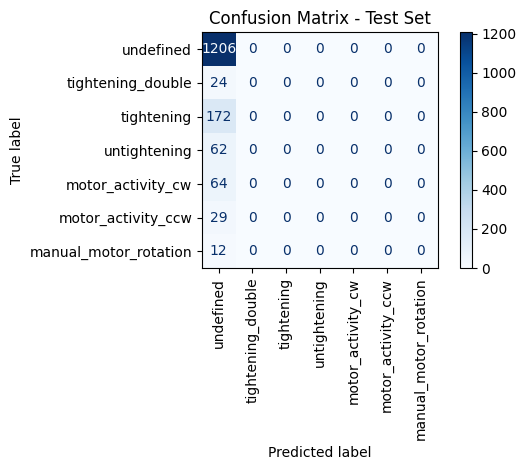

In [239]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get predictions and true labels for the test set
class_names = ["undefined", "tightening_double","tightening","untightening","motor_activity_cw","motor_activity_ccw","manual_motor_rotation"]

# Obtener etiquetas reales y predicciones
y_true = [y.item() for y in y_test]
y_pred = []
model.eval()
with torch.no_grad():
    for x in X_test:
        x_tensor = x.T.unsqueeze(0).to(device)
        output = model(x_tensor)
        pred = output.argmax(dim=1).item()
        y_pred.append(pred)

# Matriz de confusión
cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

# Graficar
disp.plot(cmap='Blues', xticks_rotation=90)
plt.title("Confusion Matrix - Test Set")
plt.tight_layout()
plt.show()
